In [0]:
# dbfs:/FileStore/tables/Mental_Health_Dataset-1.csv

In [0]:
from pyspark.sql import SparkSession
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import chi2_contingency
import plotly.express as px
from matplotlib.patches import Patch
from pyspark.sql import SparkSession
from pyspark.sql.functions import when, col, sum, round, avg, lit, concat, expr, pandas_udf
import time

In [0]:
file_path = "dbfs:/FileStore/tables/Mental_Health_Dataset.csv"
mHealth_df = spark.read.csv(file_path, header=True, inferSchema=True)

In [0]:
mHealth_df.printSchema()

root
 |-- Timestamp: string (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- self_employed: string (nullable = true)
 |-- family_history: string (nullable = true)
 |-- treatment: string (nullable = true)
 |-- Days_Indoors: string (nullable = true)
 |-- Growing_Stress: string (nullable = true)
 |-- Changes_Habits: string (nullable = true)
 |-- Mental_Health_History: string (nullable = true)
 |-- Mood_Swings: string (nullable = true)
 |-- Coping_Struggles: string (nullable = true)
 |-- Work_Interest: string (nullable = true)
 |-- Social_Weakness: string (nullable = true)
 |-- mental_health_interview: string (nullable = true)
 |-- care_options: string (nullable = true)



In [0]:
mHealth_df.show(5)

+---------------+------+-------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+
|      Timestamp|Gender|      Country|Occupation|self_employed|family_history|treatment|Days_Indoors|Growing_Stress|Changes_Habits|Mental_Health_History|Mood_Swings|Coping_Struggles|Work_Interest|Social_Weakness|mental_health_interview|care_options|
+---------------+------+-------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+
|8/27/2014 11:29|Female|United States| Corporate|         null|            No|      Yes|   1-14 days|           Yes|            No|                  Yes|     Medium|              No|           No|            Yes|                     No|    Not sure|


In [0]:
mHealth_df.describe().show()

+-------+---------------+------+-------------+----------+-------------+--------------+---------+------------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+
|summary|      Timestamp|Gender|      Country|Occupation|self_employed|family_history|treatment|      Days_Indoors|Growing_Stress|Changes_Habits|Mental_Health_History|Mood_Swings|Coping_Struggles|Work_Interest|Social_Weakness|mental_health_interview|care_options|
+-------+---------------+------+-------------+----------+-------------+--------------+---------+------------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+
|  count|         292364|292364|       292364|    292364|       287162|        292364|   292364|            292364|        292364|        292364|               292364|     292364|          292364|       29236

In [0]:
num_rows = mHealth_df.count()
print(f"Number of rows: {num_rows}")

Number of rows: 292364


In [0]:
distinct_countries = mHealth_df.select("Country").distinct().count()
print(f"Number of distinct countries: {distinct_countries}")

Number of distinct countries: 35


In [0]:
# Check for duplicates in the dataset
duplicates = mHealth_df.count() - mHealth_df.dropDuplicates().count()
print("Number of duplicate rows:", duplicates)

Number of duplicate rows: 2313


In [0]:
# Drop duplicate rows
mHealth_df_cleaned = mHealth_df.dropDuplicates()

In [0]:
# Verify that the duplicates have been dropped
duplicates = mHealth_df_cleaned.count() - mHealth_df_cleaned.dropDuplicates().count()
print("Number of duplicate rows:", duplicates)

Number of duplicate rows: 0


In [0]:
# Count the number of null values in each column and display them
null_counts = mHealth_df_cleaned.select([sum(col(c).isNull().cast("int")).alias(c) for c in mHealth_df_cleaned.columns])
null_counts.display()

Timestamp,Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
0,0,0,0,5193,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:

from pyspark.sql import functions as F
# Calculate the mode of the 'self_employed' column
mode_value = mHealth_df_cleaned.groupBy("self_employed").count().orderBy("count", ascending=False).first()[0]

# Replace missing values with the mode
mHealth_df_cleaned = mHealth_df_cleaned.withColumn(
    'self_employed',
    F.when(F.col('self_employed').isNull(), mode_value).otherwise(F.col('self_employed'))
)

# Show the DataFrame to verify the changes
mHealth_df_cleaned.show()

+---------------+------+--------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+
|      Timestamp|Gender|       Country|Occupation|self_employed|family_history|treatment|Days_Indoors|Growing_Stress|Changes_Habits|Mental_Health_History|Mood_Swings|Coping_Struggles|Work_Interest|Social_Weakness|mental_health_interview|care_options|
+---------------+------+--------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+
|8/27/2014 11:49|Female|        Poland| Corporate|           No|            No|      Yes|   1-14 days|           Yes|            No|                  Yes|     Medium|              No|           No|            Yes|                  Maybe|    Not su

In [0]:
# Count the number of null values in each column and display them
null_counts = mHealth_df_cleaned.select([sum(col(c).isNull().cast("int")).alias(c) for c in mHealth_df_cleaned.columns])
null_counts.display()

Timestamp,Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Retrieve unique categories present in the 'Growing_Stress' column
unique_growing_stress = mHealth_df_cleaned.select("Growing_Stress").distinct().collect()
print("Unique categories in Growing_Stress:", unique_growing_stress)

Unique categories in Growing_Stress: [Row(Growing_Stress='Maybe'), Row(Growing_Stress='No'), Row(Growing_Stress='Yes')]


In [0]:
 from pyspark.sql.functions import *

In [0]:
num_rows = mHealth_df_cleaned.count()
print(f"Number of rows: {num_rows}")

Number of rows: 290051


In [0]:
# mHealth_df_cleaned = mHealth_df_cleaned.withColumn('Timestamp', col('Timestamp').cast('timestamp'))

# # Extract day name from 'Timestamp'
# mHealth_df_cleaned = mHealth_df_cleaned.withColumn('Day', expr("date_format(Timestamp, 'EEEE')"))

In [0]:
display(mHealth_df_cleaned)

Timestamp,Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
8/27/2014 14:19,Female,United States,Corporate,No,No,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,No,Yes
8/27/2014 15:29,Female,United States,Student,No,Yes,Yes,1-14 days,Yes,Maybe,Maybe,High,No,No,Yes,No,Not sure
8/27/2014 19:05,Female,Canada,Student,No,No,Yes,1-14 days,Yes,Maybe,Maybe,High,No,No,Yes,No,Not sure
8/27/2014 16:42,Female,United States,Business,No,No,Yes,More than 2 months,Yes,No,No,High,No,No,Maybe,No,Yes
8/28/2014 2:32,Female,United Kingdom,Business,No,No,Yes,More than 2 months,Yes,No,No,High,No,No,Maybe,No,No
8/27/2014 21:54,Female,United States,Student,No,No,No,1-14 days,Yes,Yes,No,High,No,Yes,Maybe,Maybe,Not sure
8/28/2014 1:56,Female,United States,Student,No,Yes,Yes,1-14 days,Yes,Yes,No,High,No,Yes,Maybe,No,Yes
9/2/2014 8:24,Female,United Kingdom,Student,No,Yes,No,1-14 days,No,Maybe,Yes,Low,No,Yes,Yes,Maybe,Yes
8/27/2014 15:36,Female,United States,Housewife,No,No,No,1-14 days,Yes,Maybe,Yes,Low,Yes,Maybe,Yes,Yes,Yes
8/27/2014 20:33,Female,United States,Housewife,No,No,No,1-14 days,Yes,Maybe,Yes,Low,Yes,Maybe,Yes,No,Not sure


In [0]:
# mHealth_df_cleaned  =  mHealth_df_cleaned.withColumn("Date", to_date(mHealth_df_cleaned["Timestamp"]))

In [0]:
display(mHealth_df_cleaned)

Timestamp,Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
8/27/2014 14:19,Female,United States,Corporate,No,No,Yes,1-14 days,Yes,No,Yes,Medium,No,No,Yes,No,Yes
8/27/2014 15:29,Female,United States,Student,No,Yes,Yes,1-14 days,Yes,Maybe,Maybe,High,No,No,Yes,No,Not sure
8/27/2014 19:05,Female,Canada,Student,No,No,Yes,1-14 days,Yes,Maybe,Maybe,High,No,No,Yes,No,Not sure
8/27/2014 16:42,Female,United States,Business,No,No,Yes,More than 2 months,Yes,No,No,High,No,No,Maybe,No,Yes
8/28/2014 2:32,Female,United Kingdom,Business,No,No,Yes,More than 2 months,Yes,No,No,High,No,No,Maybe,No,No
8/27/2014 21:54,Female,United States,Student,No,No,No,1-14 days,Yes,Yes,No,High,No,Yes,Maybe,Maybe,Not sure
8/28/2014 1:56,Female,United States,Student,No,Yes,Yes,1-14 days,Yes,Yes,No,High,No,Yes,Maybe,No,Yes
9/2/2014 8:24,Female,United Kingdom,Student,No,Yes,No,1-14 days,No,Maybe,Yes,Low,No,Yes,Yes,Maybe,Yes
8/27/2014 15:36,Female,United States,Housewife,No,No,No,1-14 days,Yes,Maybe,Yes,Low,Yes,Maybe,Yes,Yes,Yes
8/27/2014 20:33,Female,United States,Housewife,No,No,No,1-14 days,Yes,Maybe,Yes,Low,Yes,Maybe,Yes,No,Not sure


In [0]:
start_period = mHealth_df_cleaned.agg({"Timestamp": "min"}).collect()[0][0]
end_period = mHealth_df_cleaned.agg({"Timestamp": "max"}).collect()[0][0]
print("The dataset covers the period from", start_period, "to", end_period)

The dataset covers the period from 10/2/2014 21:25 to 9/9/2014 13:49


In [0]:
def get_season(month):
    if month in (3, 4, 5):
        return 'Spring'
    elif month in (6, 7, 8):
        return 'Summer'
    elif month in (9, 10, 11):
        return 'Autumn'
    else:
        return 'Winter'

# Create a UDF for season calculation
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

season_udf = udf(get_season, StringType())


In [0]:
mHealth_df_cleaned = mHealth_df_cleaned.withColumn('Season', season_udf(expr("month(Timestamp)")))

In [0]:
mHealth_df_cleaned.show(5)

+---------------+------+-------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+------+
|      Timestamp|Gender|      Country|Occupation|self_employed|family_history|treatment|Days_Indoors|Growing_Stress|Changes_Habits|Mental_Health_History|Mood_Swings|Coping_Struggles|Work_Interest|Social_Weakness|mental_health_interview|care_options|Season|
+---------------+------+-------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+------+
|8/27/2014 11:49|Female|       Poland| Corporate|           No|            No|      Yes|   1-14 days|           Yes|            No|                  Yes|     Medium|              No|           No|            Yes|                 

In [0]:
columns_to_encode = ["self_employed", "family_history", "treatment", "Coping_Struggles"]

In [0]:
for column in columns_to_encode:
    mHealth_df_cleaned = mHealth_df_cleaned.withColumn(column, when(col(column) == 'Yes', 1).otherwise(0))

In [0]:
# # Encode 'Gender' column: map 'Male' to 1 and 'Female' to 0 for binary gender representation
# mHealth_df_cleaned = mHealth_df_cleaned.withColumn('Gender', when(col('Gender') == 'Male', 1).otherwise(0))


In [0]:
# Identify columns with multiple categorical responses
columns_to_encode = ["Growing_Stress", "Changes_Habits", "Mental_Health_History", "Work_Interest", "Social_Weakness"]

In [0]:

# Predefined mapping of categories to numeric codes
fixed_mapping = {"No": 1, "Maybe": 2, "Yes": 3}


In [0]:
from pyspark.sql.types import IntegerType, StringType
def map_fixed_values(value):
    return fixed_mapping.get(value, 0)

map_fixed_values_udf = udf(map_fixed_values, IntegerType())

In [0]:
for column in columns_to_encode:
    mHealth_df_cleaned = mHealth_df_cleaned.withColumn(column, map_fixed_values_udf(col(column)))



In [0]:
# Define the order for ordinal columns using a dictionary to establish their numeric equivalents
ordinal_mappings = {
    "Days_Indoors": {"1-14 days": 1, "15-30 days": 2, "31-60 days": 3, "More than 2 months": 4, "Go out Every day": 5},
    "Mood_Swings": {"Low": 1, "Medium": 2, "High": 3},
    "mental_health_interview": {"No": 1, "Maybe": 2, "Yes": 3},
    "care_options": {"No": 1, "Not sure": 2, "Yes": 3}
}

In [0]:
def map_ordinal_values(value, mapping):
    return mapping.get(value, 0)

for column, mapping in ordinal_mappings.items():
    map_ordinal_udf = udf(lambda value: map_ordinal_values(value, mapping), IntegerType())
    mHealth_df_cleaned = mHealth_df_cleaned.withColumn(column, map_ordinal_udf(col(column)))

In [0]:
mHealth_df_cleaned.show(5)

+---------------+------+-------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+------+
|      Timestamp|Gender|      Country|Occupation|self_employed|family_history|treatment|Days_Indoors|Growing_Stress|Changes_Habits|Mental_Health_History|Mood_Swings|Coping_Struggles|Work_Interest|Social_Weakness|mental_health_interview|care_options|Season|
+---------------+------+-------------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+------+
|8/27/2014 11:49|Female|       Poland| Corporate|            0|             0|        1|           1|             3|             1|                    3|          2|               0|            1|              3|                 

In [0]:
mHealth_df_cleaned.write.csv("Mental Health Dataset(preprocessed).csv", header=True, mode='overwrite')

In [0]:
mHealth_df_cleaned = mHealth_df_cleaned.withColumn(
    'Work_interest_family_history_Interaction',
    concat(
        when(col('Work_Interest') == 1, lit('No Interest')).when(col('Work_Interest') == 2, lit('Maybe Interest')).otherwise(lit('Interest')),
        lit(' & '),
        when(col('family_history') == 1, lit('Family History')).otherwise(lit('No Family History'))
    )
)

In [0]:
interaction_treatment = mHealth_df_cleaned.groupBy('Work_interest_family_history_Interaction') \
    .agg(avg('treatment').alias('mean'), (stddev('treatment') / expr("sqrt(count(treatment))")).alias('sem')) \
    .orderBy('mean', ascending=False).toPandas()

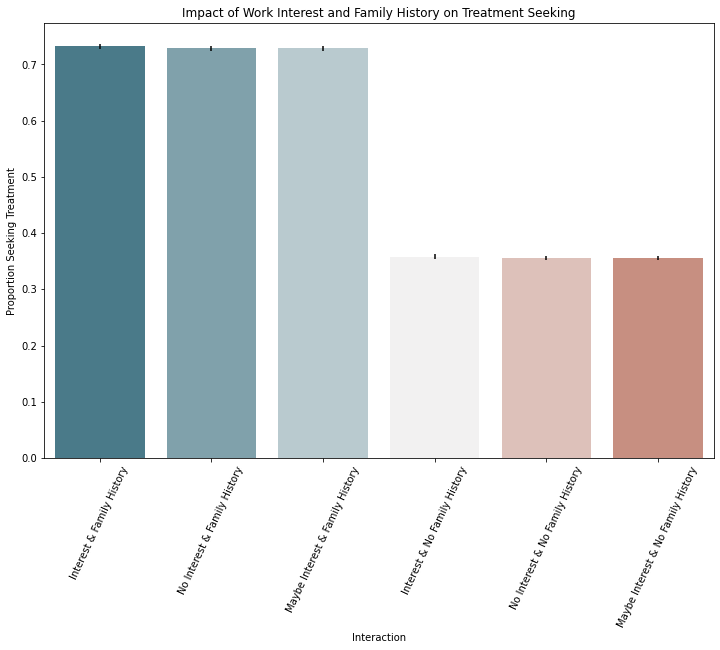

In [0]:
plt.figure(figsize=(12, 8))
sns.barplot(x='Work_interest_family_history_Interaction', y='mean', data=interaction_treatment,
            palette=sns.diverging_palette(220, 20, n=7),
            yerr=interaction_treatment['sem'] * 1.96)
plt.title('Impact of Work Interest and Family History on Treatment Seeking')
plt.xlabel('Interaction')
plt.ylabel('Proportion Seeking Treatment')
plt.xticks(rotation=65)
plt.show()

In [0]:
total_patients_by_country = mHealth_df_cleaned.groupBy("Country").agg(count("treatment").alias("total_patients"))

display(total_patients_by_country )

Country,total_patients
Russia,780
Sweden,2812
Philippines,390
Singapore,780
Germany,4680
France,2340
Greece,780
Belgium,821
Finland,390
United States,169112


Databricks visualization. Run in Databricks to view.

In [0]:

# Calculate the total number of mental health patients
total_patients = mHealth_df_cleaned.filter(col("treatment") == 1).count()

# Create a DataFrame for total patients
total_patients_df = spark.createDataFrame([(total_patients,)], ["total_patients"])

# Calculate the number of male and female patients
gender_counts = mHealth_df_cleaned.filter(col("treatment") == 1).groupBy("Gender").agg(count("Gender").alias("count"))

# Add the total number of patients to the gender_counts DataFrame
gender_counts_with_total = gender_counts.withColumn("total_patients", lit(total_patients))

# Display the combined DataFrame
display(gender_counts_with_total)

Gender,count,total_patients
Female,36204,146184
Male,109980,146184


Databricks visualization. Run in Databricks to view.

In [0]:
# Calculate the total number of mental health patients
total_patients = mHealth_df_cleaned.filter(col("treatment") == 0).count()

# Create a DataFrame for total patients
total_patients_df = spark.createDataFrame([(total_patients,)], ["total_patients"])

# Calculate the number of male and female patients
gender_counts = mHealth_df_cleaned.filter(col("treatment") == 0).groupBy("Gender").agg(count("Gender").alias("count"))

# Add the total number of patients to the gender_counts DataFrame
gender_counts_with_total = gender_counts.withColumn("total_patients", lit(total_patients))

# Display the combined DataFrame
display(gender_counts_with_total)

Gender,count,total_patients
Female,15947,143867
Male,127920,143867


Databricks visualization. Run in Databricks to view.

In [0]:
total_patients = mHealth_df_cleaned.count()

# Create a DataFrame for total patients
total_patients_df = spark.createDataFrame([(total_patients,)], ["total_patients"])

# Calculate the number of male and female patients
gender_counts = mHealth_df_cleaned.groupBy("Gender").agg(count("Gender").alias("count"))

# Add the total number of patients to the gender_counts DataFrame
gender_counts_with_total = gender_counts.withColumn("total_patients", lit(total_patients))

# Display the combined DataFrame
display(gender_counts_with_total)
 

Gender,count,total_patients
Female,52151,290051
Male,237900,290051


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

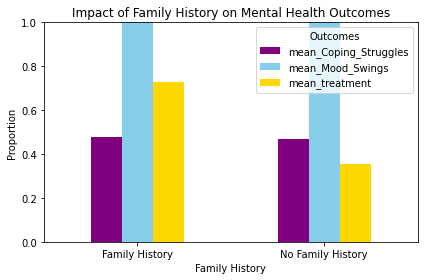

In [0]:
import pyspark.sql.functions as F

outcome_data = mHealth_df_cleaned.groupBy('family_history').agg(
    F.mean('Coping_Struggles').alias('mean_Coping_Struggles'),
    F.mean('Mood_Swings').alias('mean_Mood_Swings'),
    F.mean('treatment').alias('mean_treatment')
)

# Collect the results to a Pandas DataFrame for plotting
outcome_data_pandas = outcome_data.toPandas()

# Rename index for clarity
outcome_data_pandas['family_history'] = outcome_data_pandas['family_history'].replace({0: 'No Family History', 1: 'Family History'})

# Set 'family_history' as the index
outcome_data_pandas.set_index('family_history', inplace=True)

# Plot each mental health outcome as a separate bar
colors = ['purple', 'skyblue', 'gold']  # Colors for visual distinction
outcome_data_pandas.plot(kind='bar', color=colors)

# Customize plot appearance
plt.title('Impact of Family History on Mental Health Outcomes')
plt.xlabel('Family History')
plt.ylabel('Proportion')
plt.ylim(0, 1)  # Proportion values range from 0 to 1
plt.xticks(rotation=0)  # Horizontal x-axis labels
plt.legend(title='Outcomes')
plt.tight_layout()  # Fit plot neatly within the figure area
plt.show()

In [0]:

# Inspect distinct values in the 'Gender' column
distinct_genders = mHealth_df_cleaned.select('Gender').distinct().collect()
print("Distinct values in 'Gender' column:", distinct_genders)

Distinct values in 'Gender' column: [Row(Gender='Female'), Row(Gender='Male')]


In [0]:

# Inspect distinct values in the 'Gender' column
distinct_genders = mHealth_df_cleaned.select('Gender').distinct().collect()
print("Distinct values in 'Gender' column:", [row.Gender for row in distinct_genders])

Distinct values in 'Gender' column: ['Female', 'Male']


In [0]:
mHealth_df_cleaned.select('Gender').show(5)

+------+
|Gender|
+------+
|Female|
|Female|
|Female|
|Female|
|Female|
+------+
only showing top 5 rows



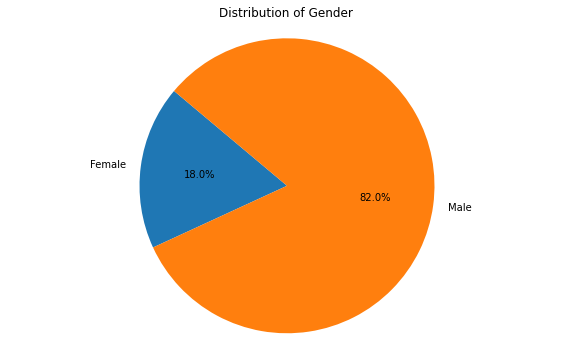

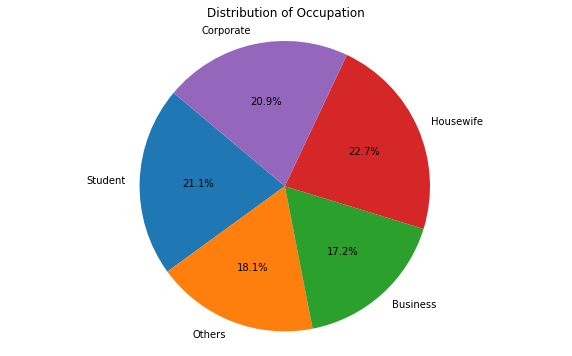

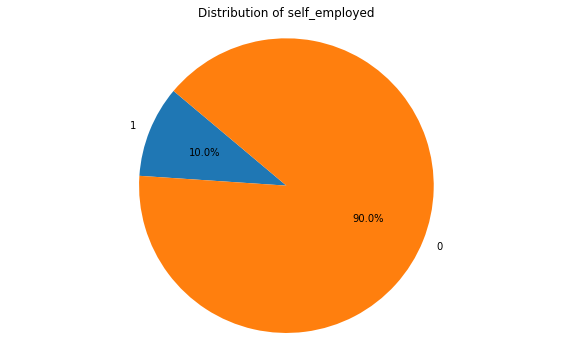

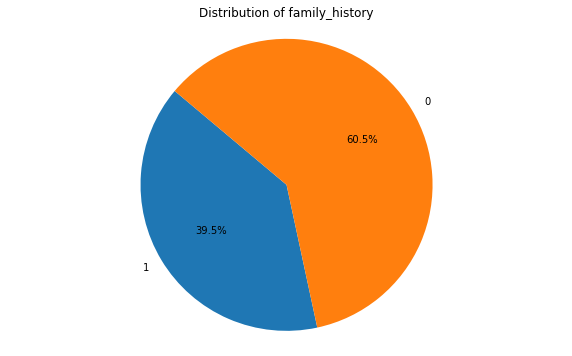

In [0]:
# Data cleaning and mapping Gender values
mHealth_df_cleaned4 = mHealth_df_cleaned.withColumn(
    'Gender',
    F.when(F.lower(F.col('Gender')).isin(['m', 'male']), 'Male')
     .when(F.lower(F.col('Gender')).isin(['f', 'female']), 'Female')
     .otherwise('Unknown')
)

# Function to create pie charts for a given categorical variable
def create_pie_chart_for_category(df, column_name):
    # Group by the categorical variable and count occurrences
    category_data = df.groupBy(column_name).count()
    
    # Collect the data to Python for plotting
    category_data_pd = category_data.toPandas()
    
    # Plot the pie chart
    plt.figure(figsize=(10, 6))
    plt.pie(category_data_pd['count'], labels=category_data_pd[column_name], autopct='%1.1f%%', startangle=140)
    plt.title(f"Distribution of {column_name}")
    plt.axis("equal")  # Equal aspect ratio ensures that pie chart is circular.
    plt.show()

# List of categorical variables to create pie charts for
categorical_variables = ['Gender', 'Occupation','self_employed','family_history']

# Generate pie charts for each categorical variable
for variable in categorical_variables:
    create_pie_chart_for_category(mHealth_df_cleaned, variable)

In [0]:

# Check the distinct values in the 'Gender' column in the original dataset
distinct_genders_original = mHealth_df_cleaned.select('Gender').distinct().collect()
print("Distinct values in 'Gender' column in the original dataset:", distinct_genders_original)

# Count the number of male and female entries in the original dataset
gender_counts_original = mHealth_df_cleaned.groupBy('Gender').count()
gender_counts_original.show()

Distinct values in 'Gender' column in the original dataset: [Row(Gender='Female'), Row(Gender='Male')]
+------+------+
|Gender| count|
+------+------+
|Female| 52151|
|  Male|237900|
+------+------+



In [0]:

from pyspark.sql.functions import col, count

# Assuming mHealth_df_cleaned is your Spark DataFrame containing 'Occupation' and 'Gender' columns

# Count the occurrences for each combination of 'Occupation' and 'Gender'
occupation_gender_counts = mHealth_df_cleaned.groupBy("Occupation", "Gender").count()

# Calculate the total count per 'Occupation' for percentage calculation
occupation_totals = mHealth_df_cleaned.groupBy("Occupation").agg(count("Gender").alias("total_count"))

# Join the counts with the totals to calculate percentages
occupation_gender_percentage = occupation_gender_counts.join(occupation_totals, "Occupation") \
    .withColumn("percentage", (col("count") / col("total_count") * 100))

# Select relevant columns and order by 'Occupation' for easier plotting later
occupation_gender_percentage = occupation_gender_percentage.select("Occupation", "Gender", "percentage").orderBy("Occupation")

# Show the result (optional, for debugging)
occupation_gender_percentage.display()

Occupation,Gender,percentage
Business,Male,80.81254139986753
Business,Female,19.18745860013248
Corporate,Male,85.4440288054315
Corporate,Female,14.555971194568496
Housewife,Male,82.37489758140381
Housewife,Female,17.625102418596185
Others,Male,80.36276849642005
Others,Female,19.63723150357995
Student,Female,19.354312202128355
Student,Male,80.64568779787164


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

In [0]:

file_path = "/dbfs/mnt/path/occupation_gender_percentage.csv"
spark_df = spark.read.csv(file_path, header=True, inferSchema=True)

In [0]:

pandas_df = spark_df.toPandas()

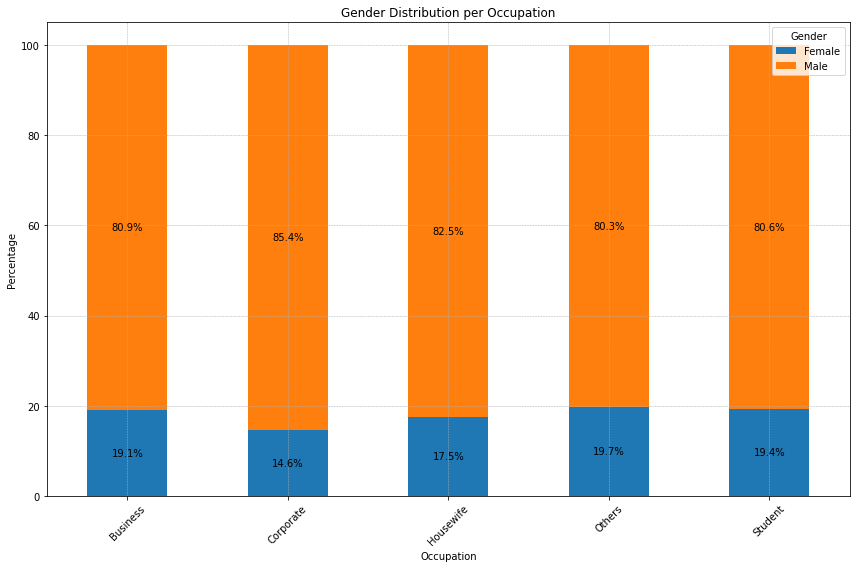

In [0]:

# Step 2: Read the CSV File into a Pandas DataFrame
# occupation_gender_df = pd.read_csv("/dbfs/dbfs/mnt/path/occupation_gender_percentage.csv")

# Step 3: Generate Pivot Table
occupation_gender_pivot = pandas_df.pivot(index='Occupation', columns='Gender', values='percentage')

# Step 4: Generate Plot
fig, ax = plt.subplots(figsize=(12, 8))
occupation_gender_pivot.plot(kind='bar', stacked=True, ax=ax)
ax.set_title('Gender Distribution per Occupation')
ax.set_xlabel('Occupation')
ax.set_ylabel('Percentage')
ax.legend(title='Gender')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Adding Annotations
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    if height > 0:  # Only annotate non-zero values
        ax.annotate(f'{height:.1f}%', (x + width / 2, y + height / 2), ha='center', va='center')

plt.show()

In [0]:
#\

In [0]:
spark_df = spark.read.csv("dbfs:/Mental Health Dataset(preprocessed).csv", header=True, inferSchema=True)

df = spark_df.toPandas()



In [0]:
gender_country_df = mHealth_df_cleaned.groupBy("Country", "Gender").count()
display(gender_country_df)

Country,Gender,count
Sweden,Female,862
United Kingdom,Female,6896
Croatia,Male,390
Sweden,Male,1950
Poland,Male,390
Ireland,Male,4680
Israel,Male,1560
France,Male,2340
Greece,Male,780
Canada,Female,3879


Databricks visualization. Run in Databricks to view.

In [0]:
data = mHealth_df_cleaned
data = data.drop('Timestamp','Season')


In [0]:
null_counts = data.select([sum(col(c).isNull().cast("int")).alias(c) for c in data.columns])
null_counts.display()
null_counts.show()

Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options,Work_interest_family_history_Interaction
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


+------+-------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+----------------------------------------+
|Gender|Country|Occupation|self_employed|family_history|treatment|Days_Indoors|Growing_Stress|Changes_Habits|Mental_Health_History|Mood_Swings|Coping_Struggles|Work_Interest|Social_Weakness|mental_health_interview|care_options|Work_interest_family_history_Interaction|
+------+-------+----------+-------------+--------------+---------+------------+--------------+--------------+---------------------+-----------+----------------+-------------+---------------+-----------------------+------------+----------------------------------------+
|     0|      0|         0|            0|             0|        0|           0|             0|             0|                    0|          0|               0|            0|              0|   

In [0]:
total_rows = mHealth_df_cleaned.count()

# Count distinct rows
distinct_rows = mHealth_df_cleaned.distinct().count()

# Calculate the number of duplicate rows
duplicate_rows = total_rows - distinct_rows

print(f"Total Rows: {total_rows}")
print(f"Distinct Rows: {distinct_rows}")
print(f"Duplicate Rows: {duplicate_rows}")

Total Rows: 290051
Distinct Rows: 290051
Duplicate Rows: 0


In [0]:
data_df = mHealth_df_cleaned

In [0]:
data_df = data_df.drop('Timestamp','Season')

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.ml.feature import VectorAssembler, StringIndexer, OneHotEncoder, StandardScaler
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier, DecisionTreeClassifier, GBTClassifier, LinearSVC, NaiveBayes, MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml import Pipeline

In [0]:
categorical_columns = [col_name for col_name, dtype in data_df.dtypes if dtype =='string' and col_name not in ['treatment']]
feature_columns = [col for col in data_df.columns if col not in ['treatment']]

In [0]:


# Identify categorical columns
categorical_columns = [col_name for col_name, dtype in data_df.dtypes if dtype == 'string' and col_name not in ['treatment']]
feature_columns = [col for col in data.columns if col not in ['treatment']]

In [0]:
indexers = [StringIndexer(inputCol=col, outputCol=col + "_Index") for col in categorical_columns]
encoders = [OneHotEncoder(inputCol=indexer.getOutputCol(), outputCol=indexer.getOutputCol() + "_Vec") for indexer in indexers]

In [0]:
encoded_feature_columns = [encoder.getOutputCol() for encoder in encoders] + [col for col in feature_columns if col not in categorical_columns]
assembler = VectorAssembler(inputCols=encoded_feature_columns, outputCol="features")

In [0]:
# Standardize features
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures")

# Define stages of the pipeline
stages = indexers + encoders + [assembler, scaler]

# Create a pipeline to apply the stages
pipeline = Pipeline(stages=stages)

# Fit and transform the data using the pipeline
pipeline_model = pipeline.fit(data_df)
data_prepared = pipeline_model.transform(data_df).select(col("scaledFeatures").alias("features"), col("treatment").alias("label"))

In [0]:
train_data, test_data = data_prepared.randomSplit([0.8, 0.2], seed=42)

In [0]:
# Initialize models
models = {
    "Logistic Regression": LogisticRegression(featuresCol="features", labelCol="label", regParam=0.01),
    "Random Forest": RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=100),
    "Decision Tree": DecisionTreeClassifier(featuresCol="features", labelCol="label", maxDepth=5),
    "Gradient-Boosted Trees": GBTClassifier(featuresCol="features", labelCol="label", maxIter=100),
    "Support Vector Machine": LinearSVC(featuresCol="features", labelCol="label", tol=0.001)
}

In [0]:
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
for name, model in models.items():
    model = model.fit(train_data)
    predictions = model.transform(test_data)
    accuracy = evaluator.evaluate(predictions)
    print(f"{name} accuracy: {accuracy}")

# Example of making a prediction with one of the models
def make_prediction(model, input_data):
    input_df = spark.createDataFrame([input_data], schema=data_prepared.schema)
    transformed_input = pipeline_model.transform(input_df)
    prediction = model.transform(transformed_input)
    predicted_label = prediction.select("prediction").collect()[0]["prediction"]
    
    if predicted_label == 1:
        print("This person seeks treatment.")
    else:
        print("This person does not seek treatment.")

Logistic Regression accuracy: 0.725918363815687


In [0]:
# # Define hyperparameter grids for tuning
# param_grids = {
#     "Logistic Regression": ParamGridBuilder().addGrid(LogisticRegression.regParam, [0.01, 0.1, 1.0]).build(),
#     "Random Forest": ParamGridBuilder().addGrid(RandomForestClassifier.numTrees, [10, 50, 100]).build(),
#     "Decision Tree": ParamGridBuilder().addGrid(DecisionTreeClassifier.maxDepth, [5, 10, 20]).build(),
#     "Gradient-Boosted Trees": ParamGridBuilder().addGrid(GBTClassifier.maxIter, [10, 50, 100]).build(),
#     "Support Vector Machine": ParamGridBuilder().addGrid(LinearSVC.maxIter, [10, 50, 100]).build(),
#     "Naive Bayes": ParamGridBuilder().addGrid(NaiveBayes.smoothing, [0.5, 1.0, 1.5]).build(),
#     "Multilayer Perceptron": ParamGridBuilder().addGrid(MultilayerPerceptronClassifier.maxIter, [50, 100, 200]).build()
# }

In [0]:



# Mapping integer codes to descriptive text for Coping_Struggles and treatment
visualisations = mHealth_df_cleaned.withColumn("Coping_Struggles", 
                                           when(col("Coping_Struggles") == 0, "No").otherwise("Yes"))

visualisations = visualisations.withColumn("treatment", 
                                           when(col("treatment") == 0, "No").otherwise("Yes"))

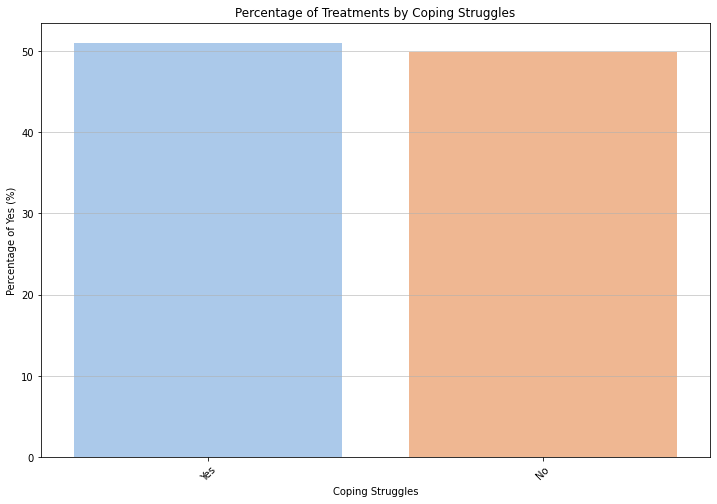

In [0]:
from pyspark.sql.functions import col, when, count, sum as spark_sum

# Group by Coping_Struggles and treatment, and count occurrences
coping_treatment_counts = visualisations.groupBy("Coping_Struggles", "treatment").agg(count("*").alias("count"))

# Calculate the total counts for each Coping_Struggles
total_counts = coping_treatment_counts.groupBy("Coping_Struggles").agg(spark_sum("count").alias("total"))

# Join the dataframes to calculate percentages
percentage_df = coping_treatment_counts.join(total_counts, "Coping_Struggles")\
    .withColumn("percentage", (col("count") / col("total")) * 100)

colors = sns.color_palette("pastel")
# Convert to Pandas for visualization
percentage_data_pandas = percentage_df.select("Coping_Struggles", "treatment", "percentage").toPandas()

# Plotting the bar chart for treatments by Coping_Struggles
plt.figure(figsize=(12, 8))
sns.barplot(data=percentage_data_pandas[percentage_data_pandas['treatment'] == 'Yes'], x='Coping_Struggles', y='percentage', palette=colors)
plt.title('Percentage of Treatments by Coping Struggles')
plt.xlabel('Coping Struggles')
plt.ylabel('Percentage of Yes (%)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.show()

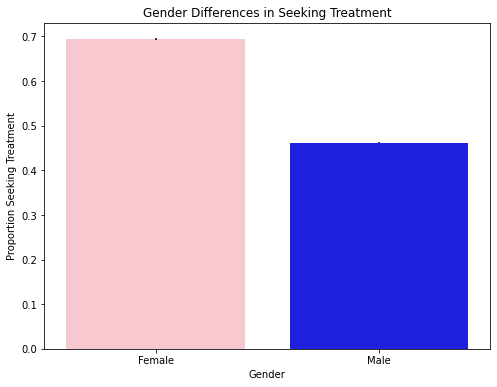

In [0]:
mHealth_df_cleaned5 = mHealth_df_cleaned.withColumn("treatment", col("treatment").cast("int"))

# Group by gender and calculate statistics
gender_treatment = mHealth_df_cleaned.groupBy("Gender").agg(
    mean("treatment").alias("mean"),
    count("treatment").alias("count"),
    stddev("treatment").alias("stddev")
)

# Compute standard error of the mean (SEM)
gender_treatment = gender_treatment.withColumn(
    "sem", col("stddev") / (col("count")**0.5)
)

# Rename index to more descriptive gender labels
gender_treatment = gender_treatment.withColumnRenamed("Gender", "gender")

# Create contingency table manually using groupBy and count
contingency_table = mHealth_df_cleaned.groupBy("Gender", "treatment").count()
contingency_table = contingency_table.groupBy("Gender").pivot("treatment").sum("count").fillna(0)

# Ensure the columns are numeric
contingency_table = contingency_table.withColumnRenamed("0", "No").withColumnRenamed("1", "Yes")
contingency_table = contingency_table.select("Gender", col("No").cast("int"), col("Yes").cast("int"))

# Convert the contingency table to Pandas DataFrame for chi-squared test
contingency_table_pandas = contingency_table.toPandas()

# Perform chi-squared test
chi2, p_value, _, _ = chi2_contingency(contingency_table_pandas.drop(columns=["Gender"]))

# Convert gender_treatment to Pandas DataFrame for plotting
gender_treatment_pd = gender_treatment.toPandas()

# Plotting using Seaborn-like plot with Matplotlib
plt.figure(figsize=(8, 6))
sns.barplot(x="gender", y="mean", yerr=gender_treatment_pd["sem"], data=gender_treatment_pd, palette=["pink", "blue"])
plt.title("Gender Differences in Seeking Treatment")
plt.ylabel("Proportion Seeking Treatment")
plt.xlabel("Gender")
plt.show()

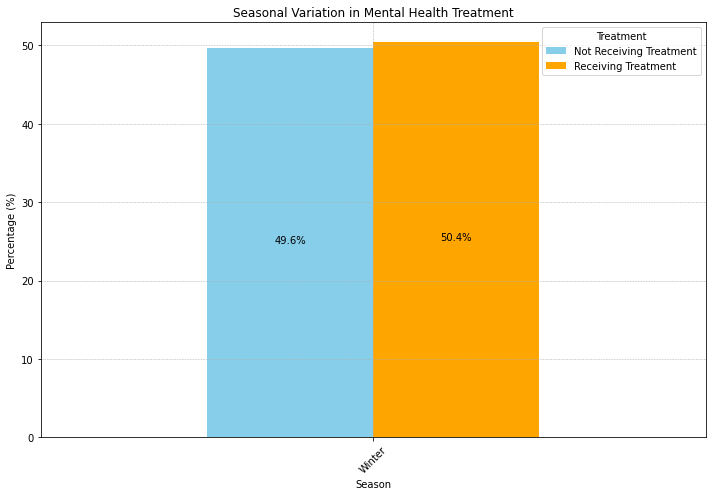

In [0]:

# Group by 'Season' and 'treatment' and count occurrences
season_treatment_counts = mHealth_df_cleaned.groupBy("Season", "treatment").count()

# Pivot the table to have columns for each treatment status (0, 1)
season_treatment_counts = season_treatment_counts.groupBy("Season").pivot("treatment").sum("count").fillna(0)

# Ensure all expected columns (0, 1) are present in the DataFrame, adding missing columns as zero
for i in [0, 1]:
    if str(i) not in season_treatment_counts.columns:
        season_treatment_counts = season_treatment_counts.withColumn(str(i), lit(0))

# Reorder the DataFrame based on custom season order
custom_order = ['Spring', 'Summer', 'Autumn', 'Winter']
season_treatment_counts = season_treatment_counts.orderBy(season_treatment_counts.Season, ascending=True)

# Calculate the percentage representation of each treatment status
season_treatment_counts = season_treatment_counts.withColumn("Total", col("0") + col("1"))
season_treatment_counts = season_treatment_counts.withColumn("No_Treatment_Percentage", (col("0") / col("Total")) * 100)
season_treatment_counts = season_treatment_counts.withColumn("Treatment_Percentage", (col("1") / col("Total")) * 100)

# Convert to Pandas DataFrame for Matplotlib visualization
season_treatment_counts_pd = season_treatment_counts.toPandas()
season_treatment_counts_pd.set_index("Season", inplace=True)

# Prepare the DataFrame for plotting
season_treatment_percentages = season_treatment_counts_pd[["No_Treatment_Percentage", "Treatment_Percentage"]]

# Plot the bar chart
ax = season_treatment_percentages.plot(kind='bar', stacked=False, figsize=(10, 7), color=['skyblue', 'orange'])
ax.set_title('Seasonal Variation in Mental Health Treatment')
ax.set_xlabel('Season')
ax.set_ylabel('Percentage (%)')
ax.legend(title='Treatment', labels=['Not Receiving Treatment', 'Receiving Treatment'])

# Adding values to each section of bars by calculating the center
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    ax.annotate(f'{height:.1f}%', (x + width/2, y + height/2), ha='center')

plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


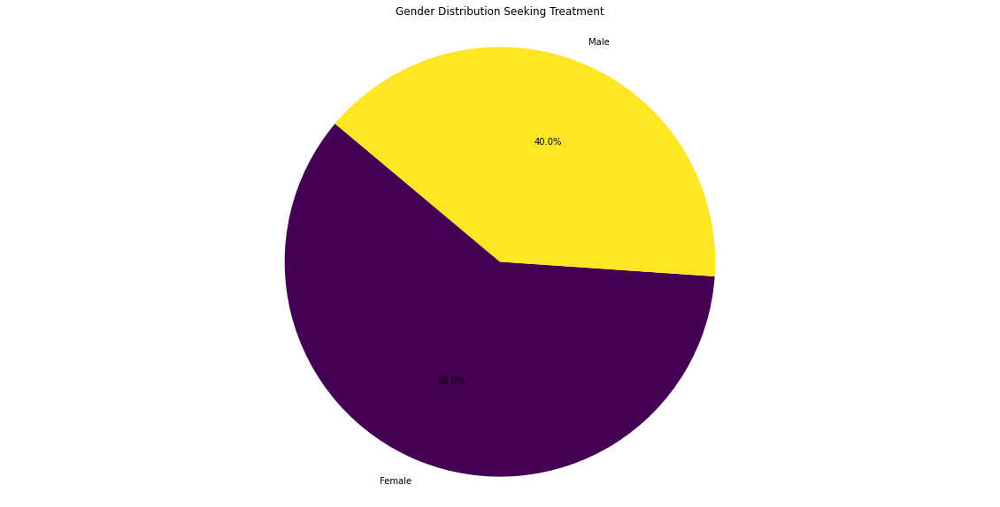

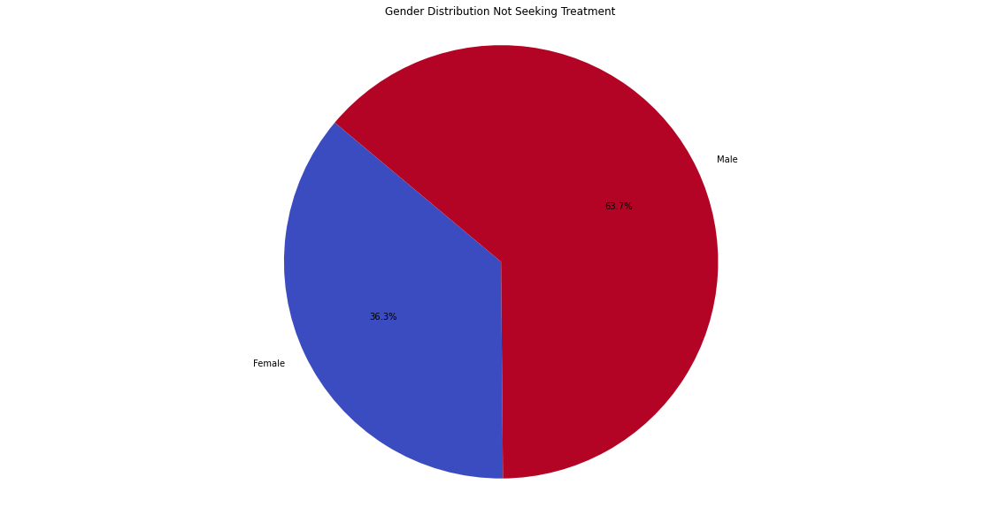

In [0]:
# Group by Gender and treatment, and count occurrences
grouped_data = mHealth_df_cleaned.groupBy('Gender', 'treatment').count()

# Calculate the total count per gender
total_counts = mHealth_df_cleaned.groupBy('Gender').count().withColumnRenamed('count', 'total_count')

# Join the grouped data with the total counts
joined_data = grouped_data.join(total_counts, on='Gender')

# Calculate the percentage
percentage_data = joined_data.withColumn('percentage', (col('count') / col('total_count')) * 100)

# Convert to Pandas DataFrame for easier manipulation and plotting
percentage_data_pandas = percentage_data.toPandas()

# Replace treatment codes with descriptive labels
percentage_data_pandas['treatment'] = percentage_data_pandas['treatment'].replace({0: 'No Treatment', 1: 'Treatment'})

# Pie chart for gender distribution among those seeking treatment
treatment_data = percentage_data_pandas[percentage_data_pandas['treatment'] == 'Treatment']
plt.figure(figsize=(20, 10))
plt.pie(treatment_data['percentage'], labels=treatment_data['Gender'], autopct='%1.1f%%', startangle=140, colors=plt.cm.viridis(np.linspace(0, 1, len(treatment_data))))
plt.title("Gender Distribution Seeking Treatment")
plt.axis("equal")  # Equal aspect ratio ensures that pie chart is circular.
plt.show()

# Pie chart for gender distribution among those not seeking treatment
no_treatment_data = percentage_data_pandas[percentage_data_pandas['treatment'] == 'No Treatment']
plt.figure(figsize=(20, 10))
plt.pie(no_treatment_data['percentage'], labels=no_treatment_data['Gender'], autopct='%1.1f%%', startangle=140, colors=plt.cm.coolwarm(np.linspace(0, 1, len(no_treatment_data))))
plt.title("Gender Distribution Not Seeking Treatment")
plt.axis("equal")  # Equal aspect ratio ensures that pie chart is circular.
plt.show()


In [0]:
from pyspark.sql.functions import col, count, sum as sum_, round
grouped_data = mHealth_df_cleaned.groupBy('Country', 'treatment').agg(count('*').alias('count'))

# Step 2: Calculate the total count for each country
total_counts = grouped_data.groupBy('Country').agg(sum_('count').alias('total'))

# Step 3: Join the grouped data with the total counts
percentage_data = grouped_data.join(total_counts, on='Country')

# Step 4: Calculate the percentage
percentage_data = percentage_data.withColumn('percentage', round((col('count') / col('total')) * 100, 2))

# Show the results
percentage_data.show()


+--------------------+---------+-----+------+----------+
|             Country|treatment|count| total|percentage|
+--------------------+---------+-----+------+----------+
|             Moldova|        1|  390|   390|     100.0|
|      United Kingdom|        0|25986| 51356|      50.6|
|             Denmark|        1|  780|   780|     100.0|
|      Czech Republic|        0|  390|   390|     100.0|
|             Germany|        0| 2340|  4680|      50.0|
|           Australia|        0| 2381|  6014|     39.59|
|         Philippines|        0|  390|   390|     100.0|
|        South Africa|        1| 1211|  1991|     60.82|
|Bosnia and Herzeg...|        0|  390|   390|     100.0|
|          Costa Rica|        0|  390|   390|     100.0|
|              Sweden|        1|  821|  2812|      29.2|
|               Italy|        0| 1560|  1560|     100.0|
|       United States|        0|77424|169112|     45.78|
|        South Africa|        0|  780|  1991|     39.18|
|              Poland|        1

In [0]:
percentage_data_pandas = percentage_data.toPandas()

          Country  treatment  count  total  percentage
0         Moldova          1    390    390       100.0
1  United Kingdom          0  25986  51356        50.6
2         Denmark          1    780    780       100.0
3  Czech Republic          0    390    390       100.0
4         Germany          0   2340   4680        50.0
Country
Australia          60.41
Brazil             33.33
Canada             53.90
Croatia           100.00
Denmark           100.00
Germany            50.00
India              29.63
Ireland            49.26
Moldova           100.00
Netherlands        33.10
New Zealand        80.41
Poland            100.00
South Africa       60.82
Sweden             29.20
Switzerland        50.00
United Kingdom     49.40
United States      54.22
Name: percentage, dtype: float64
Country
Australia                  39.59
Belgium                   100.00
Bosnia and Herzegovina    100.00
Brazil                     66.67
Canada                     46.10
Colombia                  100.0

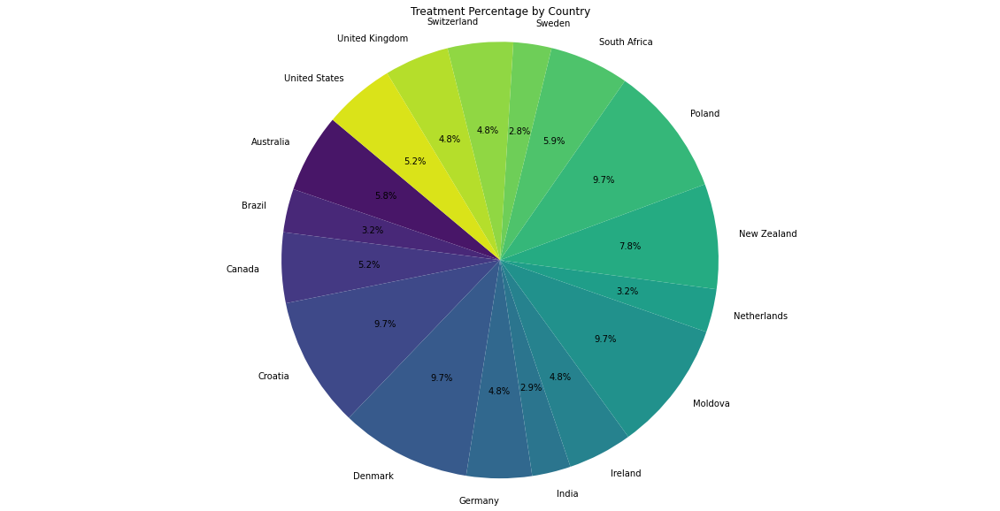

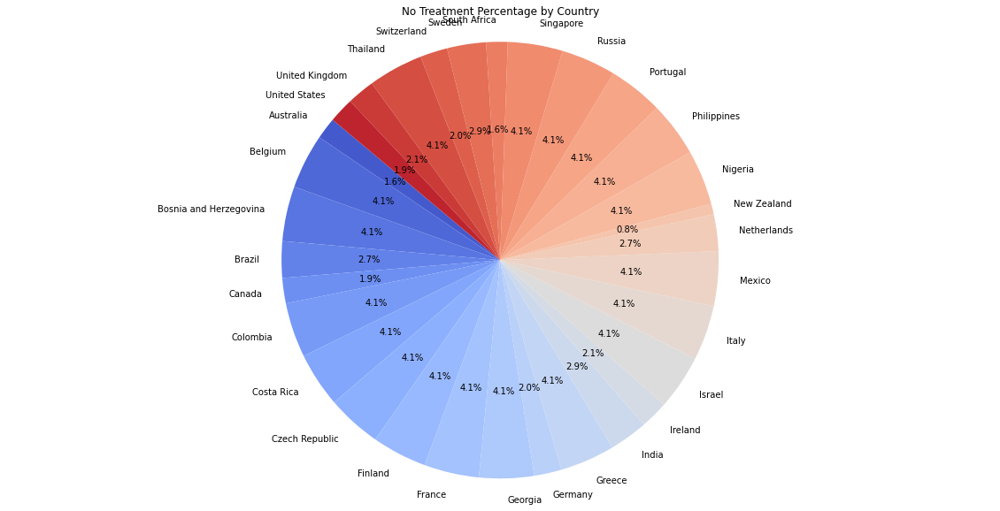

In [0]:
grouped_data = mHealth_df_cleaned.groupBy('Country', 'treatment').agg(count('*').alias('count'))

# Step 2: Calculate the total count for each country
total_counts = grouped_data.groupBy('Country').agg(sum_('count').alias('total'))

# Step 3: Join the grouped data with the total counts
percentage_data = grouped_data.join(total_counts, on='Country')

# Step 4: Calculate the percentage
percentage_data = percentage_data.withColumn('percentage', round((col('count') / col('total')) * 100, 2))

# Convert to pandas DataFrame
percentage_data_pandas = percentage_data.toPandas()

# Print to debug
print(percentage_data_pandas.head())

# Step 5: Filter and aggregate data for treatment percentage
treatment_data = percentage_data_pandas[percentage_data_pandas['treatment'] == 1]
treatment_counts = treatment_data.groupby('Country')['percentage'].sum()

# Filter and aggregate data for no treatment percentage
no_treatment_data = percentage_data_pandas[percentage_data_pandas['treatment'] == 0]
no_treatment_counts = no_treatment_data.groupby('Country')['percentage'].sum()

# Print to debug
print(treatment_counts)
print(no_treatment_counts)

# Step 6: Plot the data using matplotlib and seaborn
# Pie chart for treatment percentage
plt.figure(figsize=(20, 10))
plt.pie(treatment_counts, labels=treatment_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("viridis", len(treatment_counts)))
plt.title("Treatment Percentage by Country")
plt.axis("equal")  # Equal aspect ratio ensures that pie chart is circular.
plt.show()

# Pie chart for no treatment percentage
plt.figure(figsize=(20, 10))
plt.pie(no_treatment_counts, labels=no_treatment_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("coolwarm", len(no_treatment_counts)))
plt.title("No Treatment Percentage by Country")
plt.axis("equal")  # Equal aspect ratio ensures that pie chart is circular.
plt.show()